In [13]:
%pip install pandas numpy matplotlib plotly seaborn

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
%matplotlib inline

In [4]:
data=pd.read_csv('python_task_dataset.csv')
data.head()

,device_id,device_type,datetime,ev_type,adv_type,region_id,age,gender
0,100001,android,2019-03-01 15:58:02,0,multi,2,14,2
1,100001,android,2019-03-01 17:13:53,0,multi,2,14,2
2,100002,android,2019-03-01 23:13:25,0,multi,2,0,0
3,100002,android,2019-03-01 23:25:06,0,multi,2,0,0
4,100003,android,2019-03-01 15:27:53,0,multi,1,0,0


In [5]:
data.describe()

,device_id,ev_type,region_id,age,gender
count,265403.000000,265403.000000,265403.000000,265403.000000,265403.000000
mean,180685.732791,0.015478,1.204941,28.562051,0.932529
std,55776.059535,0.123446,0.403659,15.912911,0.376287
min,100001.000000,0.000000,1.000000,0.000000,0.000000
25%,130828.000000,0.000000,1.000000,21.000000,1.000000
50%,176487.000000,0.000000,1.000000,29.000000,1.000000
75%,228103.500000,0.000000,1.000000,38.000000,1.000000
max,287158.000000,1.000000,2.000000,75.000000,2.000000


In [6]:
data.isna().sum()

device_id      0
device_type    0
datetime       0
ev_type        0
adv_type       0
region_id      0
age            0
gender         0
dtype: int64

In [43]:
data.head(50)

,device_id,device_type,datetime,ev_type,adv_type,region_id,age,gender
0,100001,android,2019-03-01 15:58:02,0,multi,2,14,2
1,100001,android,2019-03-01 17:13:53,0,multi,2,14,2
2,100002,android,2019-03-01 23:13:25,0,multi,2,0,0
3,100002,android,2019-03-01 23:25:06,0,multi,2,0,0
4,100003,android,2019-03-01 15:27:53,0,multi,1,0,0
5,100004,android,2019-03-01 15:31:17,0,multi,1,38,1
6,100005,android,2019-03-01 15:32:34,0,multi,1,14,2
7,100006,android,2019-03-01 15:32:38,0,multi,1,0,0
8,100006,android,2019-03-01 15:57:59,0,multi,1,0,0
9,100007,android,2019-03-01 15:33:10,0,multi,1,16,2


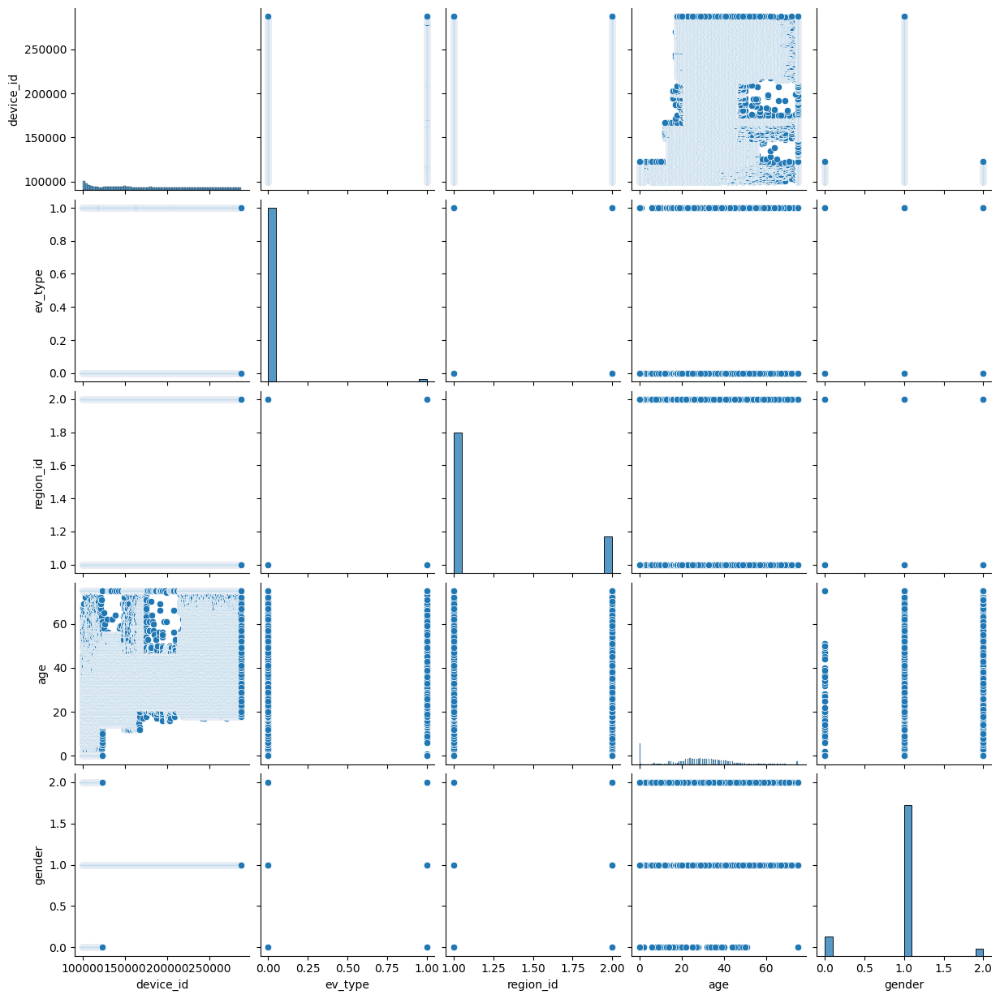

In [15]:
sns.pairplot(data)
plt.show()

In [27]:
px.histogram(data, y='ev_type', x='age', color='gender', marginal='box')

([<matplotlib.patches.Wedge at 0x1ee3c988490>,
 [Text(-0.9860850259191549, 0.4874795602463962, 'female'),
  Text(0.9184759609015558, -0.6053114150963651, 'unknown'),
  Text(1.0916112096944697, -0.1355911754848983, 'male')])

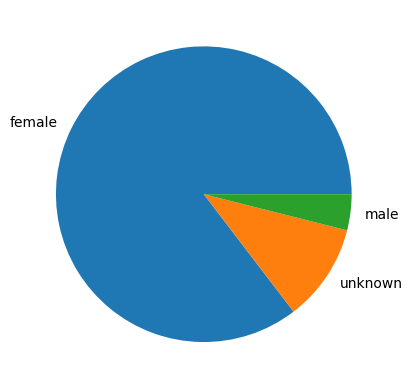

In [25]:
plt.pie(data["gender"].value_counts(), labels = ["female","unknown","male"])

In [28]:
numeric_data = data.select_dtypes(include=['float64', 'int64'])
categorical_data = pd.get_dummies(data['ev_type'])
merged_data = pd.concat([numeric_data, categorical_data], axis=1)
corr = data.corr() # рассчитывается матрица корреляций
sns.heatmap(corr, cmap='Purples', annot=True)

ValueError: could not convert string to float: 'android'

In [29]:
data['ev_type'].value_counts()

ev_type
0    261295
1      4108
Name: count, dtype: int64

In [30]:
data_group_by=data.groupby('ev_type')['gender'].sum()

In [37]:
adv_data= data.shape[0]
gender_data=data['ev_type'].sum()
adv_data/gender_data
total_adv=adv_data/gender_data
print(total_adv)

64.60637779941577


In [41]:
data['device_type'].astype['bool']

TypeError: 'method' object is not subscriptable

In [44]:
clicks_data = data[data['ev_type'] == 1]
user_clicks = clicks_data.groupby('device_id').size().reset_index(name='click_count')
print(user_clicks)

      device_id  click_count
0        100007            1
1        100020            1
2        100042            1
3        100193            1
4        100246            1
...         ...          ...
4037     286942            1
4038     286952            1
4039     286971            1
4040     287005            1
4041     287125            1

[4042 rows x 2 columns]


In [45]:
sorted_user_clicks = user_clicks.sort_values(by='click_count', ascending=False)

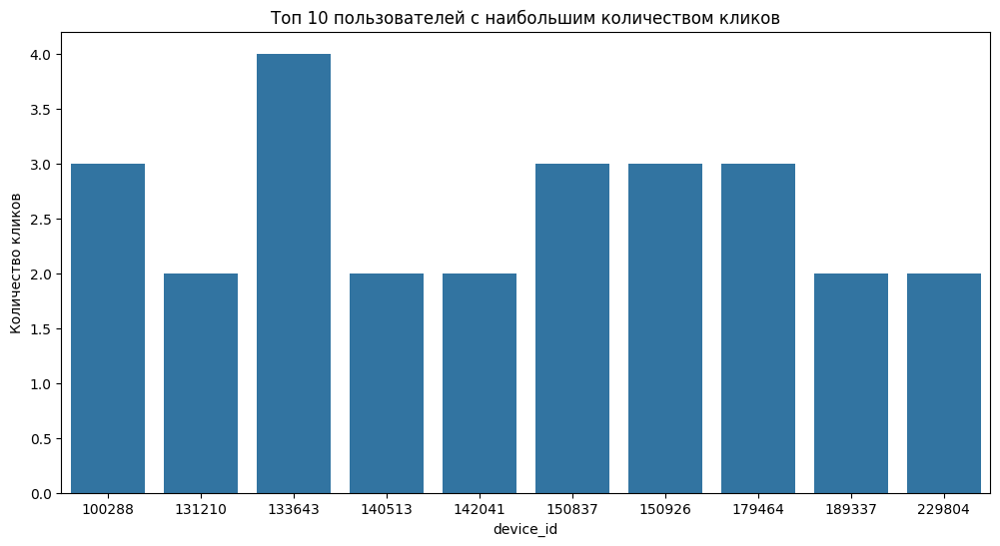

In [46]:
plt.figure(figsize=(12, 6))
sns.barplot(data=sorted_user_clicks.head(10), x='device_id', y='click_count')
plt.xlabel('device_id')
plt.ylabel('Количество кликов')
plt.title('Топ 10 пользователей с наибольшим количеством кликов')
plt.show()

In [47]:
data.dtypes

device_id       int64
device_type    object
datetime       object
ev_type         int64
adv_type       object
region_id       int64
age             int64
gender          int64
dtype: object

In [49]:
def t(r: pd.Series):
    res_1=0
    res_0=0
    for x in r:
        if x==1:
            res_1+=1
            continue
        res_0+=1
    return res_1/res_0
data.groupby('region_id').agg(['ev_type':t,'region_id':'min']).plot(x='device_type', kind='bar')

SyntaxError: invalid syntax (1443373396.py, line 10)